<a href="https://colab.research.google.com/github/Jlineros/semanai/blob/main/casoexitoyolov10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!python --version

Python 3.10.12


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/

/content/drive/MyDrive


In [ ]:
!git clone https://github.com/THU-MIG/yolov10.git

Cloning into 'yolov10'...
remote: Enumerating objects: 20304, done.
remote: Counting objects: 100% (1502/1502), done.
remote: Compressing objects: 100% (154/154), done.
remote: Total 20304 (delta 1438), reused 1348 (delta 1348), pack-reused 18802
Receiving objects: 100% (20304/20304), 11.17 MiB | 10.60 MiB/s, done.
Resolving deltas: 100% (14314/14314), done.
Updating files: 100% (580/580), done.


In [ ]:
%cd /content/drive/MyDrive/yolov10/

/content/drive/MyDrive/yolov10


In [ ]:
%ls

app.py           docs/      flops.py  mkdocs.yml      requirements.txt
CONTRIBUTING.md  examples/  LICENSE   pyproject.toml  tests/
docker/          figures/   logs/     README.md       ultralytics/


In [ ]:
!pip install -e .
!pip install -r requirements.txt #descargas en drive

Obtaining file:///content/drive/MyDrive/yolov10
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.1.34-0.editable-py3-none-any.whl size=20550 sha256=cb0ea31d1f4e8068af55bd5627e9274ec39bcd557a205b469acab64cb6ccc91d
  Stored in directory: /tmp/pip-ephem-wheel-cache-l9jexpuq/wheels/f0/8f/2b/bcb026e57910072b868c09cd32b5a46dd60fb11353f57dbe4f
Successfully built ultralytics
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.1.34
    Uninstalling ultralytics-8.1.34:
      Successfully uninstalled ultralytics-8.1.34


In [ ]:
import os
import urllib.request

# Create a directory for the weights in the current working directory
weights_dir = os.path.join(os.getcwd(), "weights")
os.makedirs(weights_dir, exist_ok=True)

# URLs of the weight files #@jhameslahm
urls = [
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10n.pt",
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10s.pt",
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10m.pt",
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10b.pt",
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10x.pt",
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10l.pt"
]

# Download each file
for url in urls:
    file_name = os.path.join(weights_dir, os.path.basename(url))
    urllib.request.urlretrieve(url, file_name)
    print(f"Downloaded {file_name}")

Downloaded /content/drive/MyDrive/yolov10/weights/yolov10n.pt
Downloaded /content/drive/MyDrive/yolov10/weights/yolov10s.pt
Downloaded /content/drive/MyDrive/yolov10/weights/yolov10m.pt
Downloaded /content/drive/MyDrive/yolov10/weights/yolov10b.pt
Downloaded /content/drive/MyDrive/yolov10/weights/yolov10x.pt
Downloaded /content/drive/MyDrive/yolov10/weights/yolov10l.pt


In [ ]:
import os
from google.colab import files
import shutil

uploaded = files.upload()

if not os.path.exists("test_images"):
    os.makedirs("test_images")

for filename in uploaded.keys():
  shutil.move(filename, "test_images/") + filename

Saving test1.png to test1 (2).png


In [ ]:
%ls

 app.py            examples/   mkdocs.yml        'test1 (1).png'   ultralytics/
 build/            figures/    pyproject.toml     test1.png        ultralytics.egg-info/
 CONTRIBUTING.md   flops.py    README.md          test_images/     weights/
 docker/           LICENSE     requirements.txt   tests/
 docs/             logs/       runs/              test_videos/


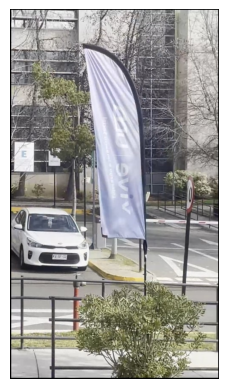

Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2762608 parameters, 63840 gradients, 8.6 GFLOPs

image 1/1 /content/drive/MyDrive/yolov10/test_images/test1.jpg: 640x384 1 2, 71.2ms
Speed: 13.6ms preprocess, 71.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model=../weights/yolov10n.pt source=test_images/test1.jpg

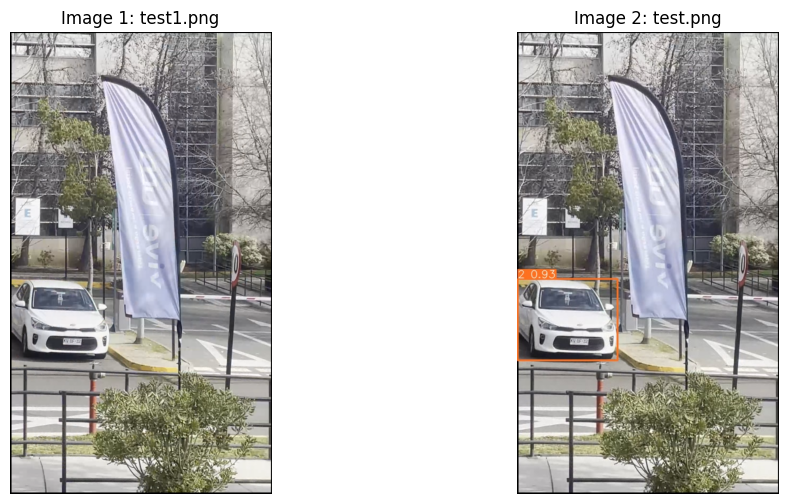

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Rutas de las imágenes
image_path1 = 'test_images/test1.png'
image_path2 = 'runs/detect/predict/test1.jpg'

# Cargar las imágenes
image1 = mpimg.imread(image_path1)
image2 = mpimg.imread(image_path2)

# Crear la figura y los ejes
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Mostrar la primera imagen
axes[0].imshow(image1)
axes[0].set_title('Image 1: test1.png')
axes[0].axis('off')  # Ocultar los ejes

# Mostrar la segunda imagen
axes[1].imshow(image2)
axes[1].set_title('Image 2: test.png')
axes[1].axis('off')  # Ocultar los ejes

# Mostrar la figura
plt.show()


In [ ]:
#Recordando donde estamos (explicacion env)
%ls

app.py           docs/      LICENSE         README.md         tests/                 weights/
build/           examples/  logs/           requirements.txt  test_videos/
CONTRIBUTING.md  figures/   mkdocs.yml      runs/             ultralytics/
docker/          flops.py   pyproject.toml  test_images/      ultralytics.egg-info/


In [ ]:
from google.colab import files
import os
import shutil

uploaded = files.upload()

if not os.path.exists("test_videos"):
    os.makedirs("test_videos")

for filename in uploaded.keys():
  shutil.move(filename, "test_videos/") + filename

Saving test1.mp4 to test1.mp4


In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model=../weights/yolov10n.pt source=test_videos/test1.mp4

Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2762608 parameters, 63840 gradients, 8.6 GFLOPs

video 1/1 (frame 1/45) /content/drive/MyDrive/yolov10/test_videos/test1.mp4: 640x384 3 2s, 117.1ms
video 1/1 (frame 2/45) /content/drive/MyDrive/yolov10/test_videos/test1.mp4: 640x384 3 2s, 16.4ms
video 1/1 (frame 3/45) /content/drive/MyDrive/yolov10/test_videos/test1.mp4: 640x384 3 2s, 19.5ms
video 1/1 (frame 4/45) /content/drive/MyDrive/yolov10/test_videos/test1.mp4: 640x384 3 2s, 28.9ms
video 1/1 (frame 5/45) /content/drive/MyDrive/yolov10/test_videos/test1.mp4: 640x384 2 2s, 20.1ms
video 1/1 (frame 6/45) /content/drive/MyDrive/yolov10/test_videos/test1.mp4: 640x384 2 2s, 18.9ms
video 1/1 (frame 7/45) /content/drive/MyDrive/yolov10/test_videos/test1.mp4: 640x384 2 2s, 24.3ms
video 1/1 (frame 8/45) /content/drive/MyDrive/yolov10/test_videos/test1.mp4: 640x384 2 2s, 26.0ms
video 1/1 (frame 9/45) /content/drive/MyD

In [ ]:
from IPython.display import HTML
from moviepy.editor import VideoFileClip, clips_array

# Rutas de los videos
video_path1 = 'test_videos/test1.mp4'
video_path2 = 'runs/detect/predict2/test1.avi'

# Cargar los videos
clip1 = VideoFileClip(video_path1)
clip2 = VideoFileClip(video_path2)

# Asegurarse de que ambos videos tengan la misma duración
min_duration = min(clip1.duration, clip2.duration)
clip1 = clip1.subclip(0, min_duration)
clip2 = clip2.subclip(0, min_duration)

# Crear un arreglo de clips para mostrar lado a lado
final_clip = clips_array([[clip1, clip2]])

# Mostrar los videos lado a lado
final_clip.ipython_display(width=800)


Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



t: 100%|██████████| 46/46 [00:05<00:00,  7.21it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/test1.mp4, 6220800 bytes wanted but 0 bytes read,at frame 45/46, at time 1.50/1.51 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4


**GRACIAS**
